In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [7]:
importlib.reload(params) #####
importlib.reload(strategies) #####
df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
n_shares = 1

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day_sim,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            shares      = n_shares,
            invest_frac = 0.1, # percentage of maximum invested cash
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/20 [00:00<?, ?it/s]

Loop finished. Days simulated: 20


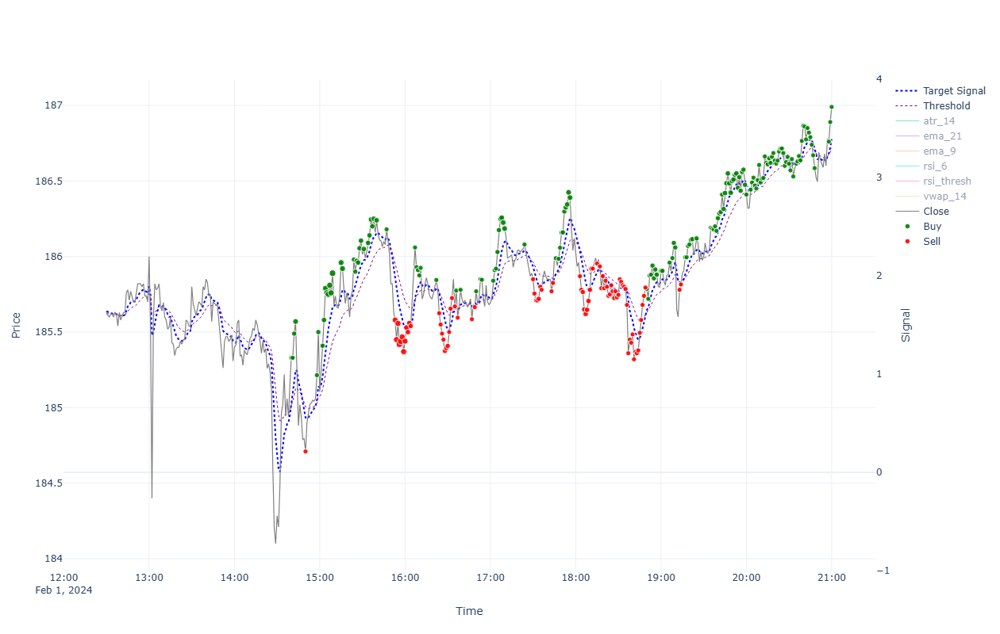


=== Performance for 2024-02-01 00:00:00 ===

INTRADAY:
  shares(623); [buy@184.322, fee_buy=0.004, pos_amnt_buy 114835.009]; [sell@186.953, fee_sell=0.018, pos_amnt_sell 116460.076]; PNL=1625.067
TRADES:
  Tr[1]: Time(14:40)Ask(185.367)Bid(185.293)Act(Buy)Shrs(1)Pos(1); CashTr(-185.371)=Cost(-185.367)-Fee(-0.004); P&L(114999.922)=CashTot(114814.629)+PosAmt(185.293)
  Tr[2]: Time(14:41)Ask(185.367)Bid(185.293)Act(Buy)Shrs(1)Pos(2); CashTr(-185.371)=Cost(-185.367)-Fee(-0.004); P&L(114999.844)=CashTot(114629.258)+PosAmt(370.586)
  Tr[3]: Time(14:42)Ask(185.527)Bid(185.453)Act(Buy)Shrs(2)Pos(4); CashTr(-371.062)=Cost(-371.054)-Fee(-0.008); P&L(115000.007)=CashTot(114258.196)+PosAmt(741.812)
  Tr[4]: Time(14:43)Ask(185.607)Bid(185.533)Act(Buy)Shrs(4)Pos(8); CashTr(-742.444)=Cost(-742.428)-Fee(-0.016); P&L(115000.014)=CashTot(113515.751)+PosAmt(1484.263)
  Tr[5]: Time(14:50)Ask(184.747)Bid(184.673)Act(Sell)Shrs(1)Pos(7); CashTr(184.655)=Cost(184.673)-Fee(-0.018); P&L(114993.117)=CashTot(113

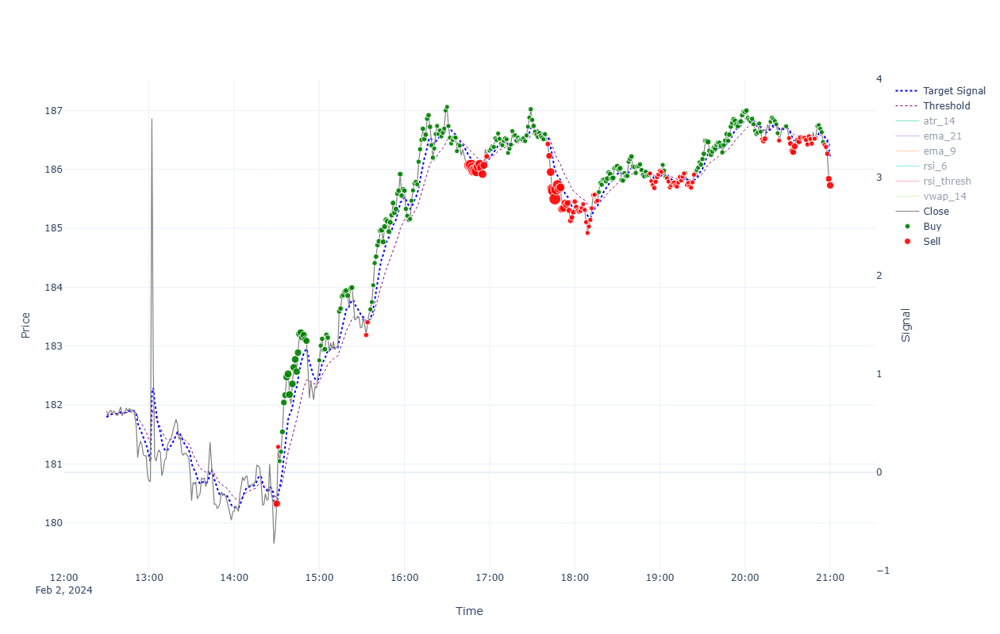


=== Performance for 2024-02-02 00:00:00 ===

INTRADAY:
  shares(645); [buy@180.366, fee_buy=0.004, pos_amnt_buy 116338.693]; [sell@185.693, fee_sell=0.018, pos_amnt_sell 119760.112]; PNL=3421.42
TRADES:
  Tr[1]: Time(14:30)Ask(180.366)Bid(180.294)Act(Sell)Shrs(11)Pos(134); CashTr(1983.034)=Cost(1983.233)-Fee(-0.2); P&L(114041.494)=CashTot(89882.107)+PosAmt(24159.387)
  Tr[2]: Time(14:31)Ask(181.329)Bid(181.256)Act(Sell)Shrs(1)Pos(133); CashTr(181.238)=Cost(181.256)-Fee(-0.018); P&L(114170.425)=CashTot(90063.345)+PosAmt(24107.08)
  Tr[3]: Time(14:32)Ask(181.086)Bid(181.014)Act(Buy)Shrs(1)Pos(134); CashTr(-181.09)=Cost(-181.086)-Fee(-0.004); P&L(114138.103)=CashTot(89882.255)+PosAmt(24255.848)
  Tr[4]: Time(14:33)Ask(181.246)Bid(181.174)Act(Buy)Shrs(2)Pos(136); CashTr(-362.5)=Cost(-362.492)-Fee(-0.008); P&L(114159.385)=CashTot(89519.754)+PosAmt(24639.631)
  Tr[5]: Time(14:34)Ask(181.584)Bid(181.511)Act(Buy)Shrs(5)Pos(141); CashTr(-907.94)=Cost(-907.92)-Fee(-0.02); P&L(114204.907)=CashTo

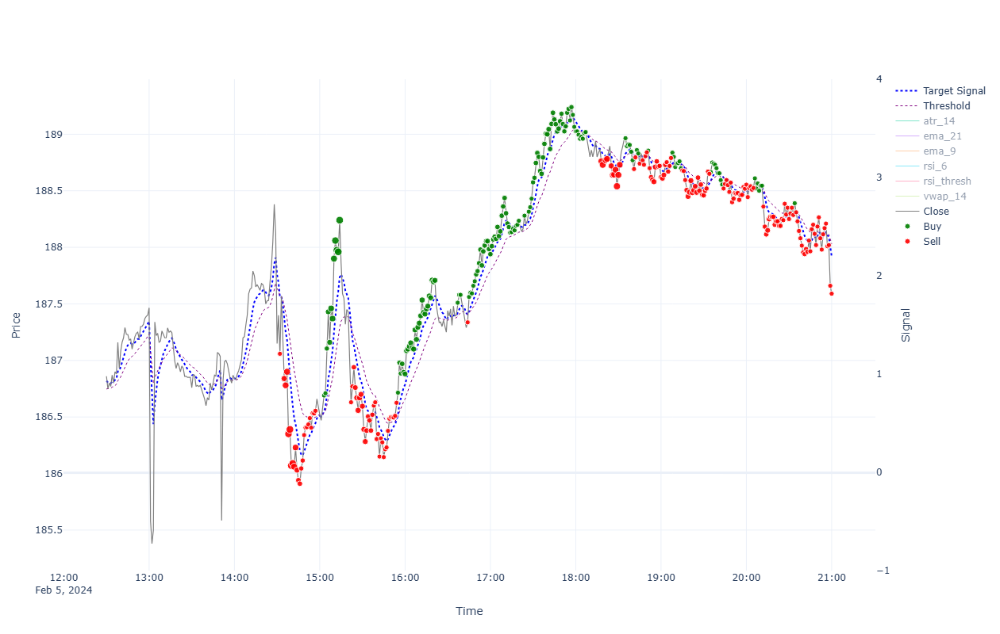


=== Performance for 2024-02-05 00:00:00 ===

INTRADAY:
  shares(639); [buy@187.187, fee_buy=0.004, pos_amnt_buy 119615.324]; [sell@187.552, fee_sell=0.018, pos_amnt_sell 119834.34]; PNL=219.016
TRADES:
  Tr[1]: Time(14:32)Ask(187.096)Bid(187.021)Act(Sell)Shrs(1)Pos(110); CashTr(187.003)=Cost(187.021)-Fee(-0.018); P&L(115437.533)=CashTot(94865.169)+PosAmt(20572.364)
  Tr[2]: Time(14:35)Ask(186.877)Bid(186.803)Act(Sell)Shrs(6)Pos(104); CashTr(1120.706)=Cost(1120.816)-Fee(-0.11); P&L(115413.349)=CashTot(95985.875)+PosAmt(19427.474)
  Tr[3]: Time(14:36)Ask(186.817)Bid(186.743)Act(Sell)Shrs(8)Pos(96); CashTr(1493.795)=Cost(1493.941)-Fee(-0.146); P&L(115406.964)=CashTot(97479.67)+PosAmt(17927.294)
  Tr[4]: Time(14:37)Ask(186.937)Bid(186.863)Act(Sell)Shrs(9)Pos(87); CashTr(1681.599)=Cost(1681.764)-Fee(-0.165); P&L(115418.317)=CashTot(99161.269)+PosAmt(16257.048)
  Tr[5]: Time(14:38)Ask(186.387)Bid(186.313)Act(Sell)Shrs(11)Pos(76); CashTr(2049.238)=Cost(2049.439)-Fee(-0.201); P&L(115370.267)=

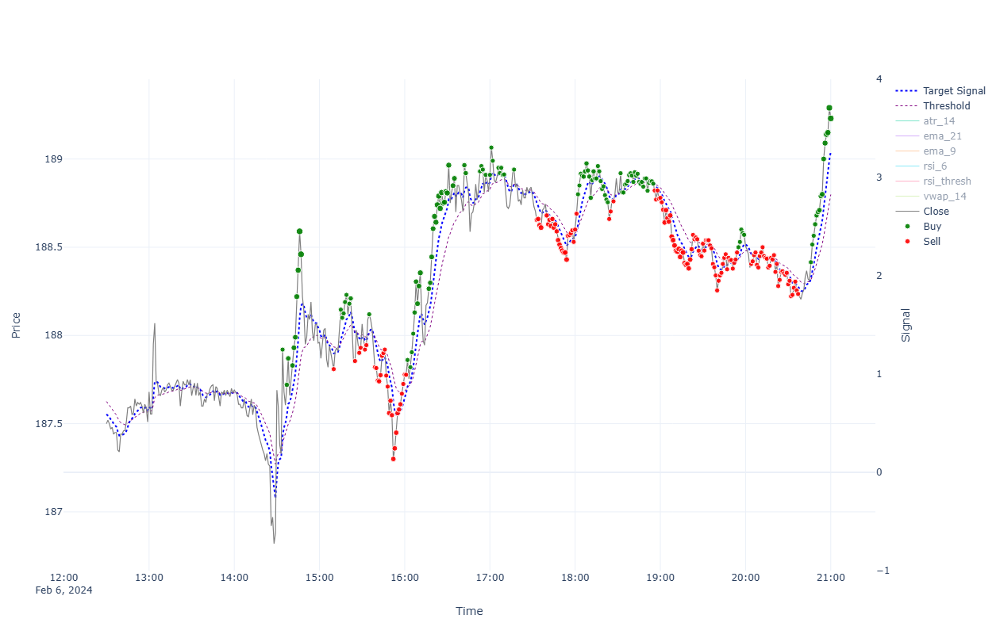


=== Performance for 2024-02-06 00:00:00 ===

INTRADAY:
  shares(638); [buy@187.728, fee_buy=0.004, pos_amnt_buy 119772.721]; [sell@189.192, fee_sell=0.018, pos_amnt_sell 120692.892]; PNL=920.171
TRADES:
  Tr[1]: Time(14:34)Ask(187.958)Bid(187.882)Act(Buy)Shrs(1)Pos(24); CashTr(-187.962)=Cost(-187.958)-Fee(-0.004); P&L(115342.05)=CashTot(110832.872)+PosAmt(4509.178)
  Tr[2]: Time(14:37)Ask(187.758)Bid(187.682)Act(Buy)Shrs(2)Pos(26); CashTr(-375.523)=Cost(-375.515)-Fee(-0.008); P&L(115337.093)=CashTot(110457.349)+PosAmt(4879.744)
  Tr[3]: Time(14:38)Ask(187.908)Bid(187.832)Act(Buy)Shrs(3)Pos(29); CashTr(-563.735)=Cost(-563.723)-Fee(-0.012); P&L(115340.755)=CashTot(109893.614)+PosAmt(5447.14)
  Tr[4]: Time(14:41)Ask(187.868)Bid(187.792)Act(Buy)Shrs(3)Pos(32); CashTr(-563.615)=Cost(-563.603)-Fee(-0.012); P&L(115339.357)=CashTot(109330.0)+PosAmt(6009.358)
  Tr[5]: Time(14:42)Ask(187.968)Bid(187.892)Act(Buy)Shrs(4)Pos(36); CashTr(-751.886)=Cost(-751.87)-Fee(-0.016); P&L(115342.24)=CashTot(1

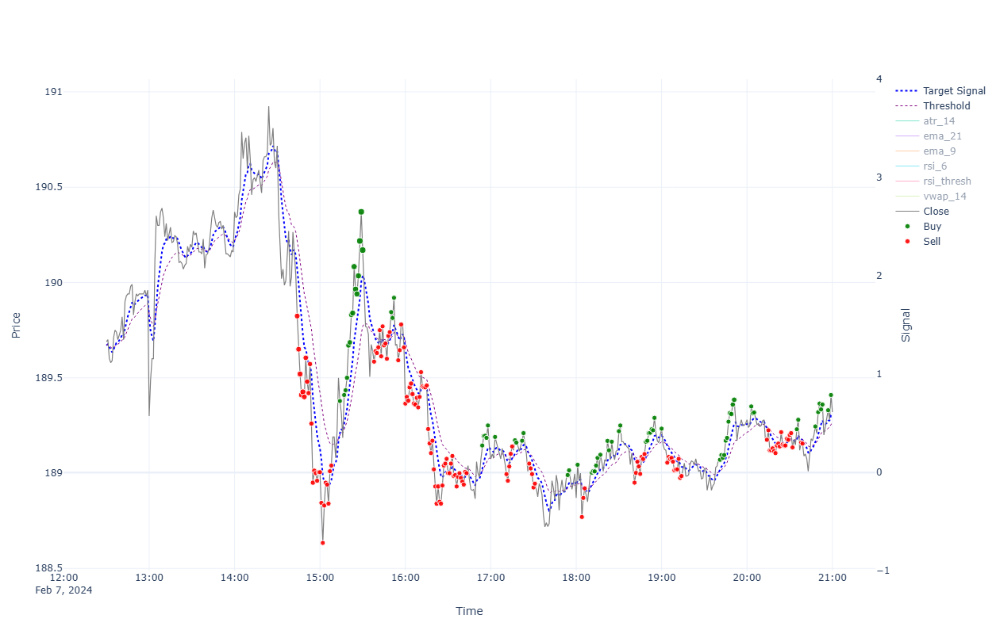


=== Performance for 2024-02-07 00:00:00 ===

INTRADAY:
  shares(632); [buy@190.755, fee_buy=0.004, pos_amnt_buy 120559.526]; [sell@189.282, fee_sell=0.018, pos_amnt_sell 119614.717]; PNL=-944.809
TRADES:
  Tr[1]: Time(14:44)Ask(189.862)Bid(189.786)Act(Sell)Shrs(4)Pos(51); CashTr(759.071)=Cost(759.145)-Fee(-0.073); P&L(115312.988)=CashTot(105633.895)+PosAmt(9679.093)
  Tr[2]: Time(14:45)Ask(189.688)Bid(189.612)Act(Sell)Shrs(4)Pos(47); CashTr(758.375)=Cost(758.448)-Fee(-0.073); P&L(115304.037)=CashTot(106392.27)+PosAmt(8911.767)
  Tr[3]: Time(14:46)Ask(189.558)Bid(189.482)Act(Sell)Shrs(5)Pos(42); CashTr(947.319)=Cost(947.41)-Fee(-0.092); P&L(115297.837)=CashTot(107339.589)+PosAmt(7958.248)
  Tr[4]: Time(14:47)Ask(189.448)Bid(189.372)Act(Sell)Shrs(5)Pos(37); CashTr(946.769)=Cost(946.861)-Fee(-0.092); P&L(115293.13)=CashTot(108286.358)+PosAmt(7006.772)
  Tr[5]: Time(14:48)Ask(189.464)Bid(189.388)Act(Sell)Shrs(5)Pos(32); CashTr(946.849)=Cost(946.941)-Fee(-0.092); P&L(115293.626)=CashTot(10

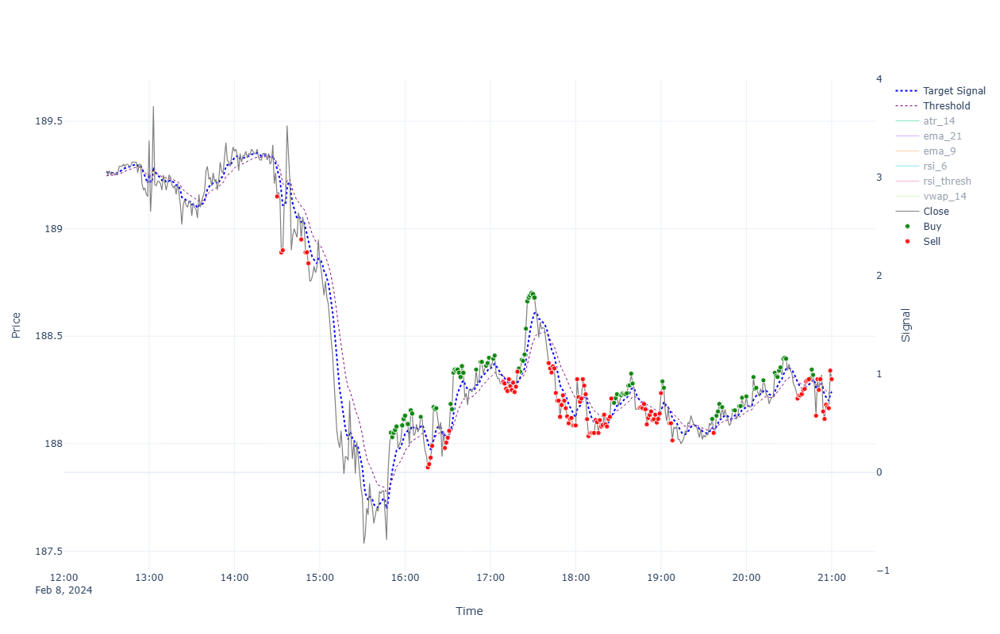


=== Performance for 2024-02-08 00:00:00 ===

INTRADAY:
  shares(632); [buy@189.188, fee_buy=0.004, pos_amnt_buy 119569.237]; [sell@188.262, fee_sell=0.018, pos_amnt_sell 118970.221]; PNL=-599.016
TRADES:
  Tr[1]: Time(14:30)Ask(189.188)Bid(189.112)Act(Sell)Shrs(1)Pos(6); CashTr(189.094)=Cost(189.112)-Fee(-0.018); P&L(115218.226)=CashTot(114083.553)+PosAmt(1134.673)
  Tr[2]: Time(14:33)Ask(188.927)Bid(188.851)Act(Sell)Shrs(1)Pos(5); CashTr(188.833)=Cost(188.851)-Fee(-0.018); P&L(115216.644)=CashTot(114272.386)+PosAmt(944.257)
  Tr[3]: Time(14:34)Ask(188.938)Bid(188.862)Act(Sell)Shrs(1)Pos(4); CashTr(188.844)=Cost(188.862)-Fee(-0.018); P&L(115216.679)=CashTot(114461.23)+PosAmt(755.449)
  Tr[4]: Time(14:47)Ask(188.988)Bid(188.912)Act(Sell)Shrs(1)Pos(3); CashTr(188.894)=Cost(188.912)-Fee(-0.018); P&L(115216.861)=CashTot(114650.124)+PosAmt(566.737)
  Tr[5]: Time(14:50)Ask(188.928)Bid(188.852)Act(Sell)Shrs(1)Pos(2); CashTr(188.834)=Cost(188.852)-Fee(-0.018); P&L(115216.663)=CashTot(114838.9

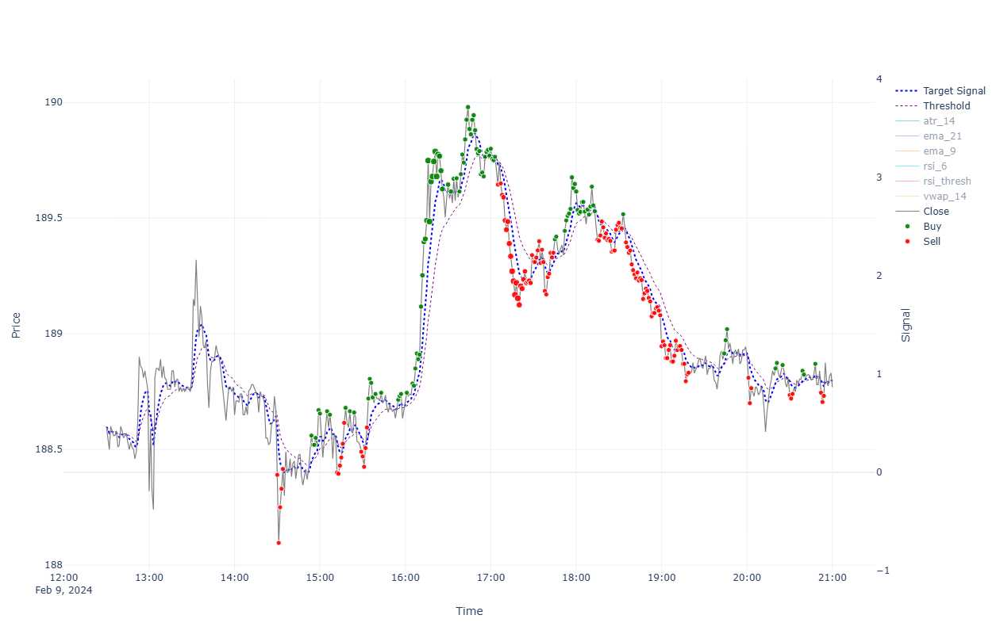


=== Performance for 2024-02-09 00:00:00 ===

INTRADAY:
  shares(631); [buy@188.428, fee_buy=0.004, pos_amnt_buy 118900.389]; [sell@188.732, fee_sell=0.018, pos_amnt_sell 119078.48]; PNL=178.092
TRADES:
  Tr[1]: Time(14:30)Ask(188.428)Bid(188.352)Act(Sell)Shrs(1)Pos(4); CashTr(188.334)=Cost(188.352)-Fee(-0.018); P&L(115190.693)=CashTot(114437.283)+PosAmt(753.409)
  Tr[2]: Time(14:31)Ask(188.134)Bid(188.058)Act(Sell)Shrs(1)Pos(3); CashTr(188.04)=Cost(188.058)-Fee(-0.018); P&L(115189.499)=CashTot(114625.324)+PosAmt(564.175)
  Tr[3]: Time(14:32)Ask(188.288)Bid(188.212)Act(Sell)Shrs(1)Pos(2); CashTr(188.194)=Cost(188.212)-Fee(-0.018); P&L(115189.942)=CashTot(114813.518)+PosAmt(376.425)
  Tr[4]: Time(14:33)Ask(188.368)Bid(188.292)Act(Sell)Shrs(1)Pos(1); CashTr(188.274)=Cost(188.292)-Fee(-0.018); P&L(115190.084)=CashTot(115001.792)+PosAmt(188.292)
  Tr[5]: Time(14:34)Ask(188.453)Bid(188.377)Act(Sell)Shrs(1)Pos(0); CashTr(188.359)=Cost(188.377)-Fee(-0.018); P&L(115190.151)=CashTot(115190.151)

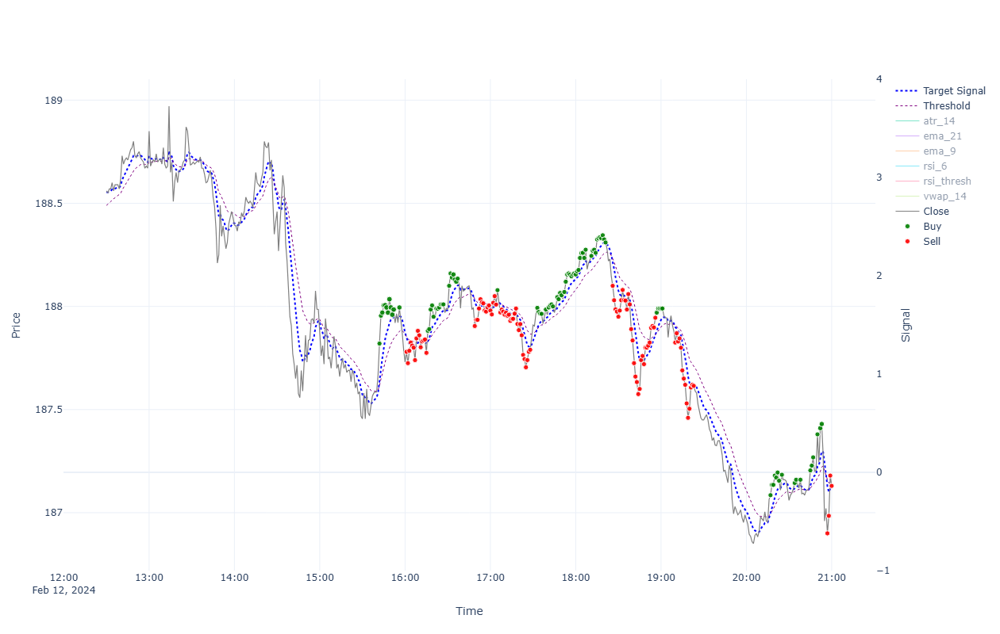


=== Performance for 2024-02-12 00:00:00 ===

INTRADAY:
  shares(631); [buy@188.498, fee_buy=0.004, pos_amnt_buy 118944.568]; [sell@187.093, fee_sell=0.018, pos_amnt_sell 118043.871]; PNL=-900.697
TRADES:
  Tr[1]: Time(15:42)Ask(187.858)Bid(187.782)Act(Buy)Shrs(1)Pos(1); CashTr(-187.862)=Cost(-187.858)-Fee(-0.004); P&L(115107.732)=CashTot(114919.95)+PosAmt(187.782)
  Tr[2]: Time(15:43)Ask(187.993)Bid(187.917)Act(Buy)Shrs(1)Pos(2); CashTr(-187.997)=Cost(-187.993)-Fee(-0.004); P&L(115107.788)=CashTot(114731.953)+PosAmt(375.835)
  Tr[3]: Time(15:44)Ask(188.008)Bid(187.933)Act(Buy)Shrs(2)Pos(4); CashTr(-376.024)=Cost(-376.016)-Fee(-0.008); P&L(115107.66)=CashTot(114355.929)+PosAmt(751.731)
  Tr[4]: Time(15:45)Ask(188.043)Bid(187.967)Act(Buy)Shrs(3)Pos(7); CashTr(-564.14)=Cost(-564.128)-Fee(-0.012); P&L(115107.561)=CashTot(113791.79)+PosAmt(1315.772)
  Tr[5]: Time(15:46)Ask(188.043)Bid(187.968)Act(Buy)Shrs(3)Pos(10); CashTr(-564.142)=Cost(-564.13)-Fee(-0.012); P&L(115107.329)=CashTot(113227

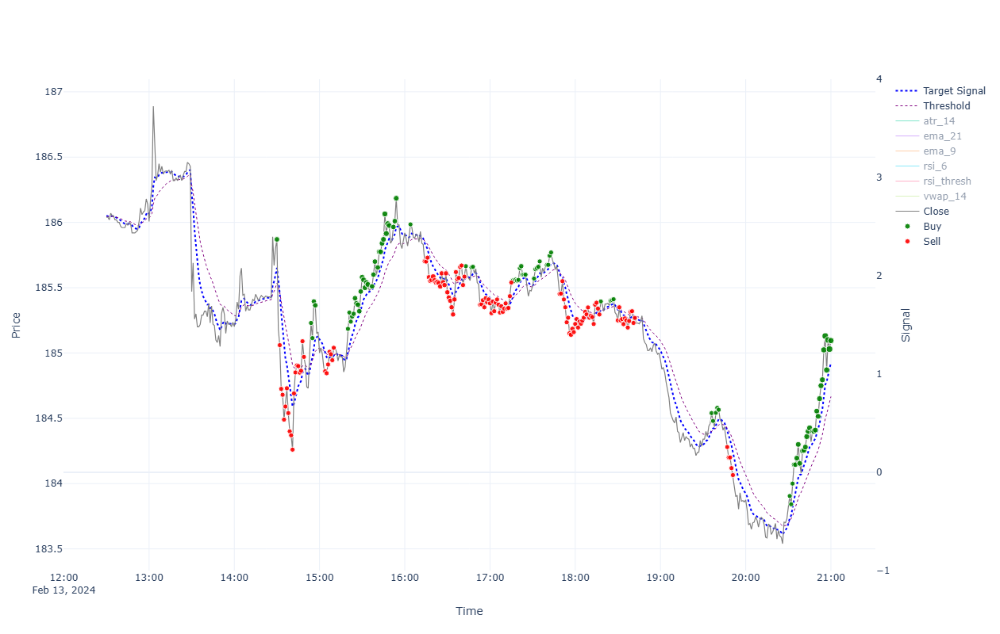


=== Performance for 2024-02-13 00:00:00 ===

INTRADAY:
  shares(634); [buy@185.907, fee_buy=0.004, pos_amnt_buy 117867.684]; [sell@185.058, fee_sell=0.018, pos_amnt_sell 117315.191]; PNL=-552.493
TRADES:
  Tr[1]: Time(14:30)Ask(185.907)Bid(185.833)Act(Buy)Shrs(3)Pos(18); CashTr(-557.734)=Cost(-557.722)-Fee(-0.012); P&L(115054.45)=CashTot(111709.46)+PosAmt(3344.991)
  Tr[2]: Time(14:32)Ask(185.097)Bid(185.023)Act(Sell)Shrs(1)Pos(17); CashTr(185.005)=Cost(185.023)-Fee(-0.018); P&L(115039.855)=CashTot(111894.464)+PosAmt(3145.391)
  Tr[3]: Time(14:33)Ask(184.762)Bid(184.688)Act(Sell)Shrs(1)Pos(16); CashTr(184.67)=Cost(184.688)-Fee(-0.018); P&L(115034.143)=CashTot(112079.134)+PosAmt(2955.009)
  Tr[4]: Time(14:34)Ask(184.717)Bid(184.643)Act(Sell)Shrs(1)Pos(15); CashTr(184.625)=Cost(184.643)-Fee(-0.018); P&L(115033.405)=CashTot(112263.759)+PosAmt(2769.646)
  Tr[5]: Time(14:35)Ask(184.527)Bid(184.453)Act(Sell)Shrs(1)Pos(14); CashTr(184.435)=Cost(184.453)-Fee(-0.018); P&L(115030.537)=CashTot(1

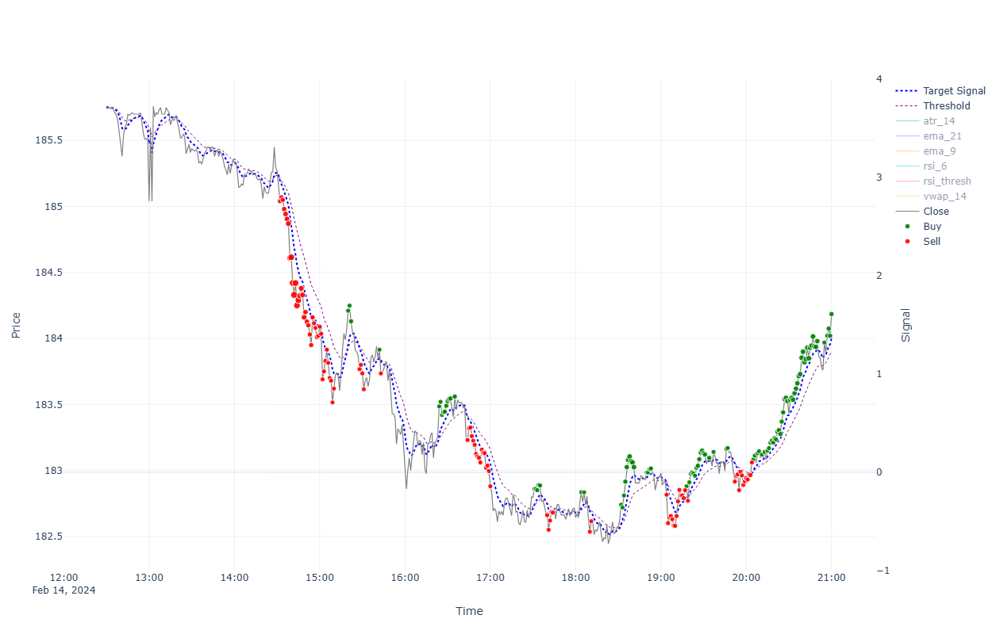


=== Performance for 2024-02-14 00:00:00 ===

INTRADAY:
  shares(633); [buy@185.307, fee_buy=0.004, pos_amnt_buy 117301.897]; [sell@184.148, fee_sell=0.018, pos_amnt_sell 116554.25]; PNL=-747.647
TRADES:
  Tr[1]: Time(14:32)Ask(185.077)Bid(185.003)Act(Sell)Shrs(1)Pos(120); CashTr(184.985)=Cost(185.003)-Fee(-0.018); P&L(115025.996)=CashTot(92825.637)+PosAmt(22200.359)
  Tr[2]: Time(14:33)Ask(185.107)Bid(185.033)Act(Sell)Shrs(1)Pos(119); CashTr(185.015)=Cost(185.033)-Fee(-0.018); P&L(115029.577)=CashTot(93010.652)+PosAmt(22018.925)
  Tr[3]: Time(14:34)Ask(185.087)Bid(185.013)Act(Sell)Shrs(2)Pos(117); CashTr(369.989)=Cost(370.026)-Fee(-0.036); P&L(115027.161)=CashTot(93380.641)+PosAmt(21646.52)
  Tr[4]: Time(14:35)Ask(185.017)Bid(184.943)Act(Sell)Shrs(3)Pos(114); CashTr(554.774)=Cost(554.829)-Fee(-0.055); P&L(115018.918)=CashTot(93935.415)+PosAmt(21083.502)
  Tr[5]: Time(14:36)Ask(184.98)Bid(184.906)Act(Sell)Shrs(4)Pos(110); CashTr(739.551)=Cost(739.624)-Fee(-0.073); P&L(115014.628)=CashT

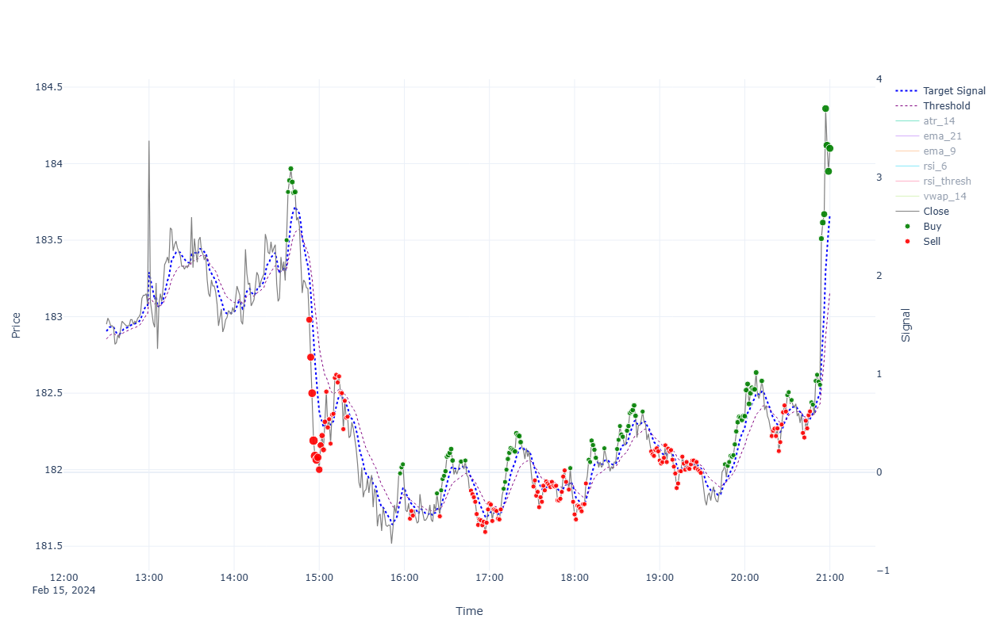


=== Performance for 2024-02-15 00:00:00 ===

INTRADAY:
  shares(636); [buy@183.252, fee_buy=0.004, pos_amnt_buy 116550.589]; [sell@184.063, fee_sell=0.018, pos_amnt_sell 117052.592]; PNL=502.003
TRADES:
  Tr[1]: Time(14:37)Ask(183.537)Bid(183.463)Act(Buy)Shrs(1)Pos(139); CashTr(-183.541)=Cost(-183.537)-Fee(-0.004); P&L(114903.955)=CashTot(89402.557)+PosAmt(25501.399)
  Tr[2]: Time(14:38)Ask(183.852)Bid(183.778)Act(Buy)Shrs(1)Pos(140); CashTr(-183.856)=Cost(-183.852)-Fee(-0.004); P&L(114947.654)=CashTot(89218.701)+PosAmt(25728.953)
  Tr[3]: Time(14:39)Ask(183.927)Bid(183.853)Act(Buy)Shrs(3)Pos(143); CashTr(-551.792)=Cost(-551.78)-Fee(-0.012); P&L(114957.919)=CashTot(88666.909)+PosAmt(26291.011)
  Tr[4]: Time(14:40)Ask(184.004)Bid(183.93)Act(Buy)Shrs(4)Pos(147); CashTr(-736.032)=Cost(-736.016)-Fee(-0.016); P&L(114968.632)=CashTot(87930.877)+PosAmt(27037.755)
  Tr[5]: Time(14:41)Ask(183.917)Bid(183.843)Act(Buy)Shrs(4)Pos(151); CashTr(-735.683)=Cost(-735.667)-Fee(-0.016); P&L(114955.521)=

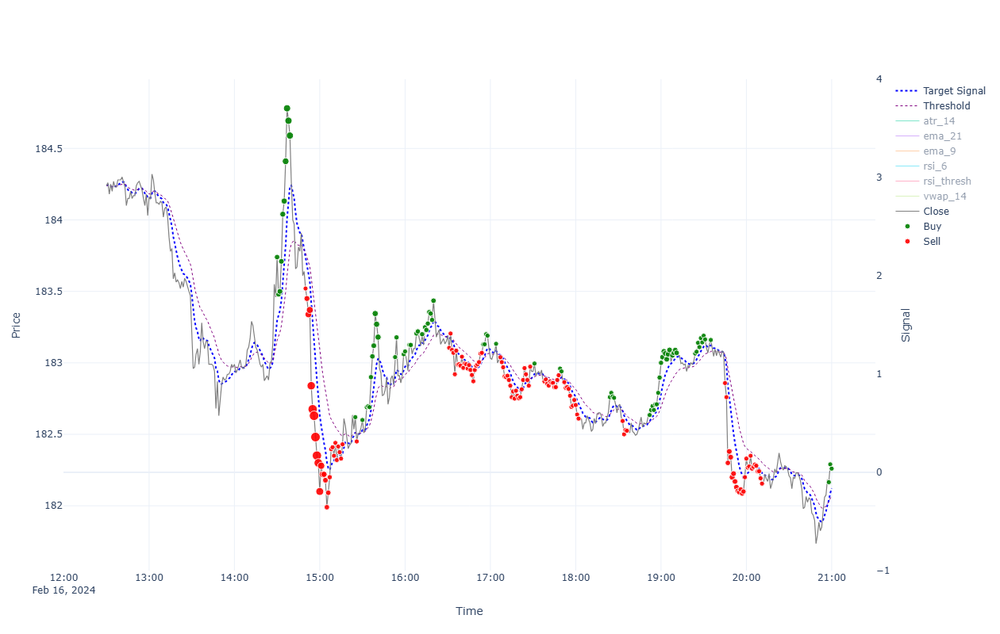


=== Performance for 2024-02-16 00:00:00 ===

INTRADAY:
  shares(636); [buy@183.777, fee_buy=0.004, pos_amnt_buy 116884.556]; [sell@182.224, fee_sell=0.018, pos_amnt_sell 115882.613]; PNL=-1001.943
TRADES:
  Tr[1]: Time(14:30)Ask(183.777)Bid(183.703)Act(Buy)Shrs(3)Pos(130); CashTr(-551.342)=Cost(-551.33)-Fee(-0.012); P&L(114704.807)=CashTot(90823.385)+PosAmt(23881.423)
  Tr[2]: Time(14:31)Ask(183.516)Bid(183.443)Act(Buy)Shrs(3)Pos(133); CashTr(-550.56)=Cost(-550.548)-Fee(-0.012); P&L(114670.678)=CashTot(90272.825)+PosAmt(24397.853)
  Tr[3]: Time(14:32)Ask(183.537)Bid(183.463)Act(Buy)Shrs(4)Pos(137); CashTr(-734.163)=Cost(-734.147)-Fee(-0.016); P&L(114673.134)=CashTot(89538.662)+PosAmt(25134.472)
  Tr[4]: Time(14:33)Ask(183.747)Bid(183.673)Act(Buy)Shrs(4)Pos(141); CashTr(-735.003)=Cost(-734.987)-Fee(-0.016); P&L(114701.589)=CashTot(88803.659)+PosAmt(25897.929)
  Tr[5]: Time(14:34)Ask(184.077)Bid(184.003)Act(Buy)Shrs(5)Pos(146); CashTr(-920.404)=Cost(-920.384)-Fee(-0.02); P&L(114747.721)

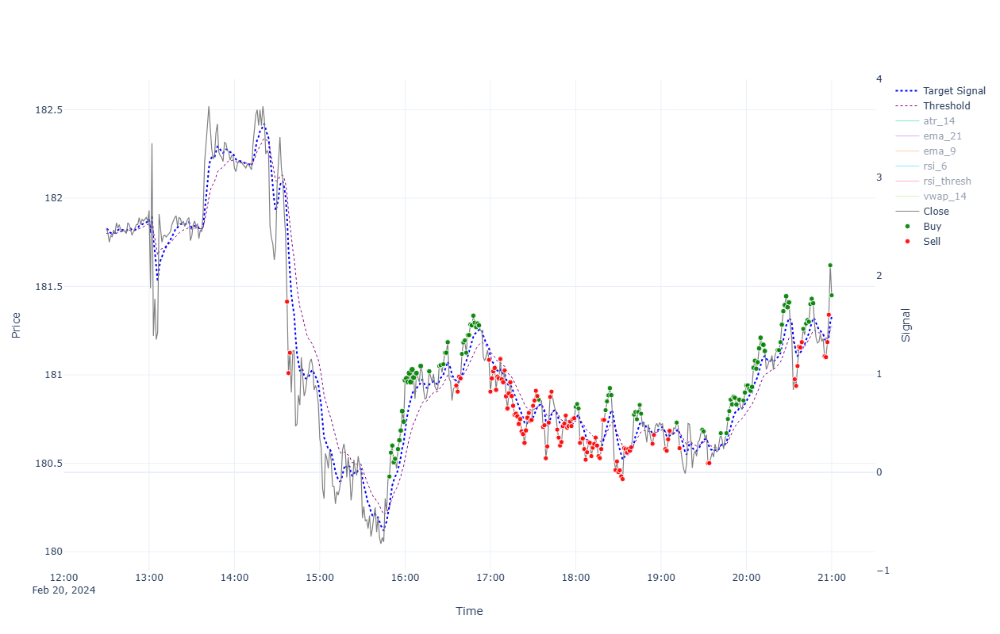


=== Performance for 2024-02-20 00:00:00 ===

INTRADAY:
  shares(636); [buy@182.109, fee_buy=0.004, pos_amnt_buy 115823.623]; [sell@181.414, fee_sell=0.018, pos_amnt_sell 115367.568]; PNL=-456.055
TRADES:
  Tr[1]: Time(14:37)Ask(181.45)Bid(181.378)Act(Sell)Shrs(1)Pos(2); CashTr(181.36)=Cost(181.378)-Fee(-0.018); P&L(114355.617)=CashTot(113992.861)+PosAmt(362.756)
  Tr[2]: Time(14:38)Ask(181.046)Bid(180.974)Act(Sell)Shrs(1)Pos(1); CashTr(180.956)=Cost(180.974)-Fee(-0.018); P&L(114354.791)=CashTot(114173.817)+PosAmt(180.974)
  Tr[3]: Time(14:39)Ask(181.161)Bid(181.089)Act(Sell)Shrs(1)Pos(0); CashTr(181.071)=Cost(181.089)-Fee(-0.018); P&L(114354.887)=CashTot(114354.887)+PosAmt(0.0)
  Tr[4]: Time(15:49)Ask(180.461)Bid(180.389)Act(Buy)Shrs(1)Pos(1); CashTr(-180.465)=Cost(-180.461)-Fee(-0.004); P&L(114354.811)=CashTot(114174.422)+PosAmt(180.389)
  Tr[5]: Time(15:50)Ask(180.596)Bid(180.524)Act(Buy)Shrs(1)Pos(2); CashTr(-180.6)=Cost(-180.596)-Fee(-0.004); P&L(114354.87)=CashTot(113993.822)+Pos

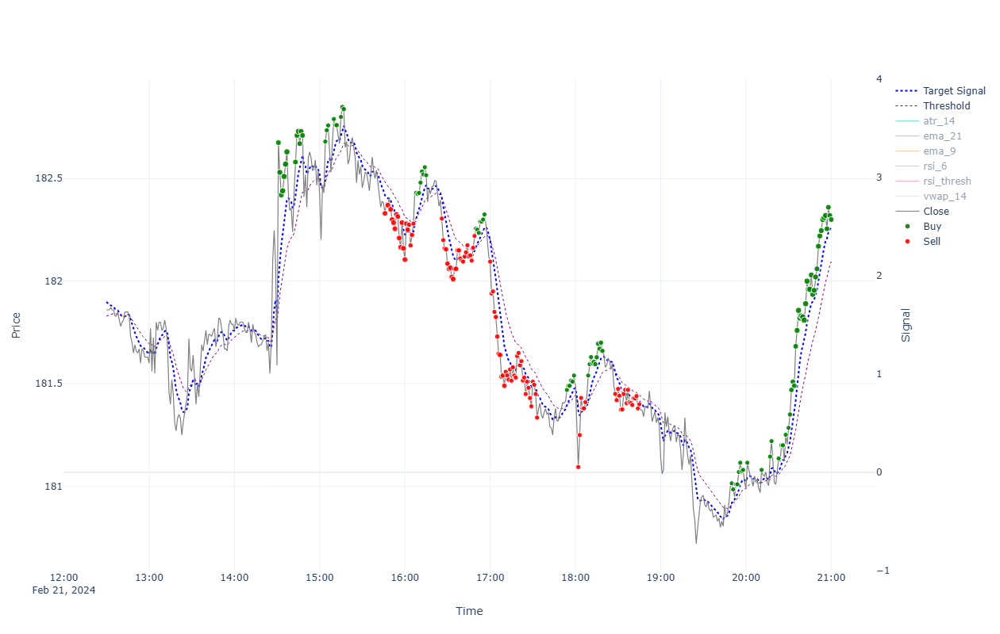


=== Performance for 2024-02-21 00:00:00 ===

INTRADAY:
  shares(635); [buy@181.626, fee_buy=0.004, pos_amnt_buy 115335.252]; [sell@182.264, fee_sell=0.018, pos_amnt_sell 115725.802]; PNL=390.55
TRADES:
  Tr[1]: Time(14:31)Ask(182.712)Bid(182.638)Act(Buy)Shrs(4)Pos(74); CashTr(-730.862)=Cost(-730.846)-Fee(-0.016); P&L(114420.598)=CashTot(100905.351)+PosAmt(13515.246)
  Tr[2]: Time(14:32)Ask(182.567)Bid(182.493)Act(Buy)Shrs(5)Pos(79); CashTr(-912.853)=Cost(-912.833)-Fee(-0.02); P&L(114409.485)=CashTot(99992.499)+PosAmt(14416.986)
  Tr[3]: Time(14:33)Ask(182.456)Bid(182.384)Act(Buy)Shrs(5)Pos(84); CashTr(-912.302)=Cost(-912.282)-Fee(-0.02); P&L(114400.412)=CashTot(99080.196)+PosAmt(15320.215)
  Tr[4]: Time(14:34)Ask(182.476)Bid(182.404)Act(Buy)Shrs(6)Pos(90); CashTr(-1094.883)=Cost(-1094.859)-Fee(-0.024); P&L(114401.629)=CashTot(97985.313)+PosAmt(16416.316)
  Tr[5]: Time(14:35)Ask(182.547)Bid(182.473)Act(Buy)Shrs(6)Pos(96); CashTr(-1095.303)=Cost(-1095.279)-Fee(-0.024); P&L(114407.466)=C

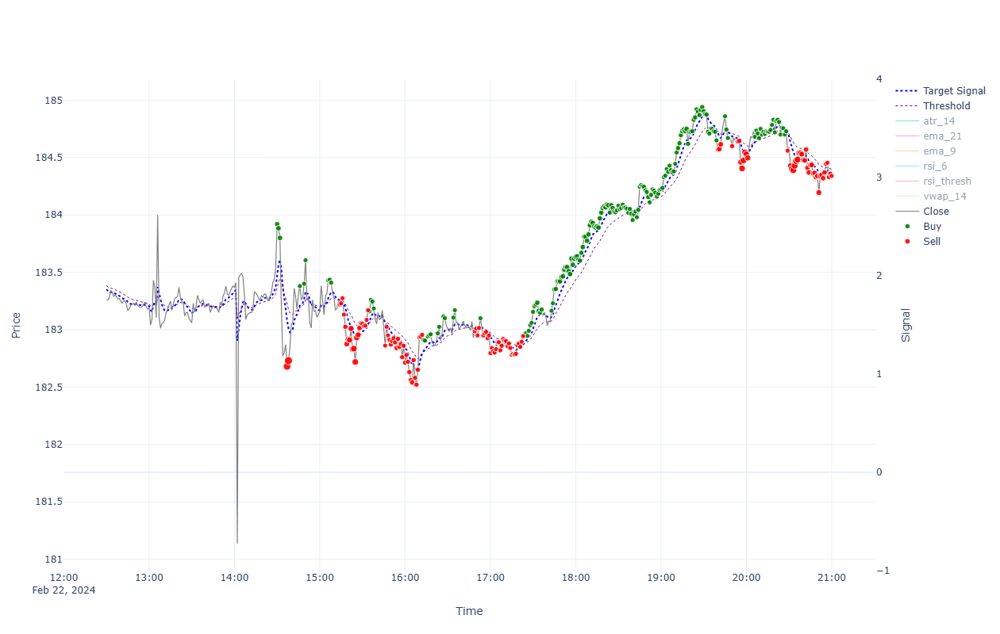


=== Performance for 2024-02-22 00:00:00 ===

INTRADAY:
  shares(629); [buy@183.957, fee_buy=0.004, pos_amnt_buy 115711.333]; [sell@184.303, fee_sell=0.018, pos_amnt_sell 115915.204]; PNL=203.871
TRADES:
  Tr[1]: Time(14:30)Ask(183.957)Bid(183.883)Act(Buy)Shrs(2)Pos(163); CashTr(-367.922)=Cost(-367.914)-Fee(-0.008); P&L(114618.587)=CashTot(84645.622)+PosAmt(29972.964)
  Tr[2]: Time(14:31)Ask(183.921)Bid(183.847)Act(Buy)Shrs(3)Pos(166); CashTr(-551.774)=Cost(-551.762)-Fee(-0.012); P&L(114612.487)=CashTot(84093.848)+PosAmt(30518.639)
  Tr[3]: Time(14:32)Ask(183.837)Bid(183.763)Act(Buy)Shrs(3)Pos(169); CashTr(-551.522)=Cost(-551.51)-Fee(-0.012); P&L(114598.313)=CashTot(83542.326)+PosAmt(31055.988)
  Tr[4]: Time(14:37)Ask(182.717)Bid(182.643)Act(Sell)Shrs(12)Pos(157); CashTr(2191.503)=Cost(2191.722)-Fee(-0.218); P&L(114408.853)=CashTot(85733.829)+PosAmt(28675.024)
  Tr[5]: Time(14:38)Ask(182.767)Bid(182.693)Act(Sell)Shrs(14)Pos(143); CashTr(2557.454)=Cost(2557.708)-Fee(-0.255); P&L(114416.

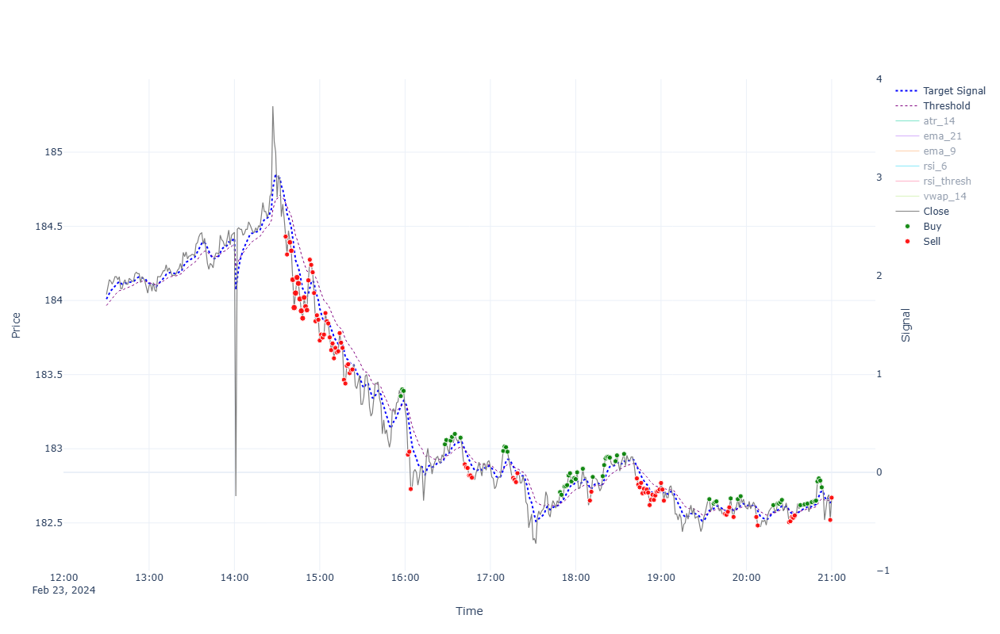


=== Performance for 2024-02-23 00:00:00 ===

INTRADAY:
  shares(627); [buy@184.732, fee_buy=0.004, pos_amnt_buy 115829.434]; [sell@182.633, fee_sell=0.018, pos_amnt_sell 114499.777]; PNL=-1329.657
TRADES:
  Tr[1]: Time(14:36)Ask(184.468)Bid(184.394)Act(Sell)Shrs(1)Pos(90); CashTr(184.376)=Cost(184.394)-Fee(-0.018); P&L(114521.629)=CashTot(97926.159)+PosAmt(16595.47)
  Tr[2]: Time(14:37)Ask(184.347)Bid(184.273)Act(Sell)Shrs(1)Pos(89); CashTr(184.255)=Cost(184.273)-Fee(-0.018); P&L(114510.732)=CashTot(98110.414)+PosAmt(16400.318)
  Tr[3]: Time(14:39)Ask(184.429)Bid(184.355)Act(Sell)Shrs(3)Pos(86); CashTr(553.011)=Cost(553.065)-Fee(-0.055); P&L(114517.965)=CashTot(98663.425)+PosAmt(15854.54)
  Tr[4]: Time(14:40)Ask(184.372)Bid(184.298)Act(Sell)Shrs(3)Pos(83); CashTr(552.84)=Cost(552.895)-Fee(-0.055); P&L(114513.027)=CashTot(99216.265)+PosAmt(15296.762)
  Tr[5]: Time(14:41)Ask(184.177)Bid(184.103)Act(Sell)Shrs(4)Pos(79); CashTr(736.34)=Cost(736.413)-Fee(-0.073); P&L(114496.755)=CashTot(99

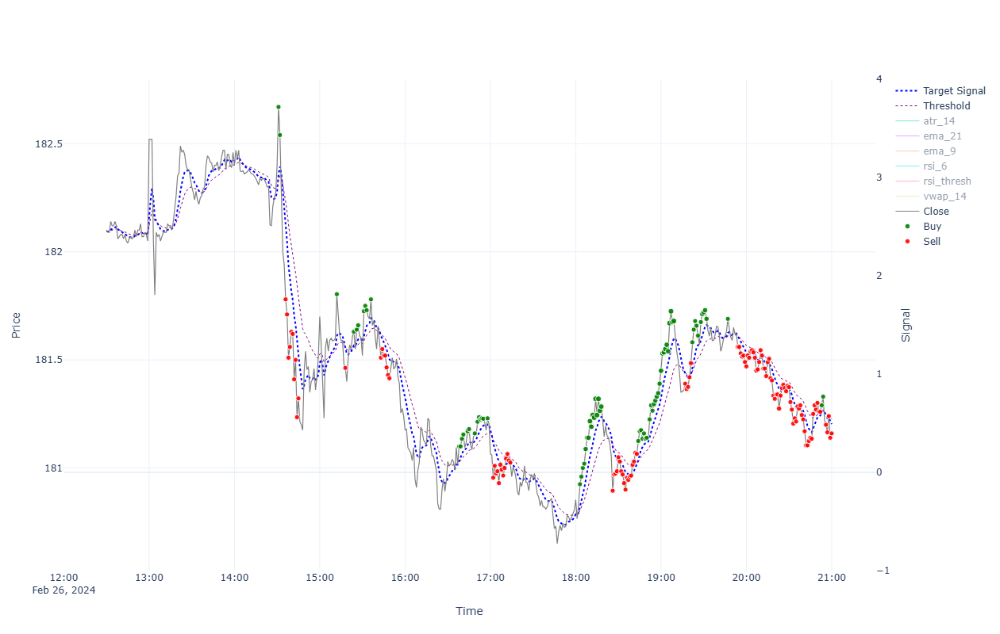


=== Performance for 2024-02-26 00:00:00 ===

INTRADAY:
  shares(627); [buy@182.436, fee_buy=0.004, pos_amnt_buy 114390.181]; [sell@181.124, fee_sell=0.018, pos_amnt_sell 113553.218]; PNL=-836.963
TRADES:
  Tr[1]: Time(14:31)Ask(182.707)Bid(182.633)Act(Buy)Shrs(1)Pos(9); CashTr(-182.711)=Cost(-182.707)-Fee(-0.004); P&L(114463.943)=CashTot(112820.242)+PosAmt(1643.701)
  Tr[2]: Time(14:32)Ask(182.577)Bid(182.503)Act(Buy)Shrs(1)Pos(10); CashTr(-182.581)=Cost(-182.577)-Fee(-0.004); P&L(114462.696)=CashTot(112637.661)+PosAmt(1825.035)
  Tr[3]: Time(14:36)Ask(181.816)Bid(181.744)Act(Sell)Shrs(1)Pos(9); CashTr(181.725)=Cost(181.744)-Fee(-0.018); P&L(114455.08)=CashTot(112819.387)+PosAmt(1635.693)
  Tr[4]: Time(14:37)Ask(181.746)Bid(181.674)Act(Sell)Shrs(1)Pos(8); CashTr(181.656)=Cost(181.674)-Fee(-0.018); P&L(114454.432)=CashTot(113001.042)+PosAmt(1453.39)
  Tr[5]: Time(14:38)Ask(181.546)Bid(181.474)Act(Sell)Shrs(1)Pos(7); CashTr(181.456)=Cost(181.474)-Fee(-0.018); P&L(114452.814)=CashTot(113

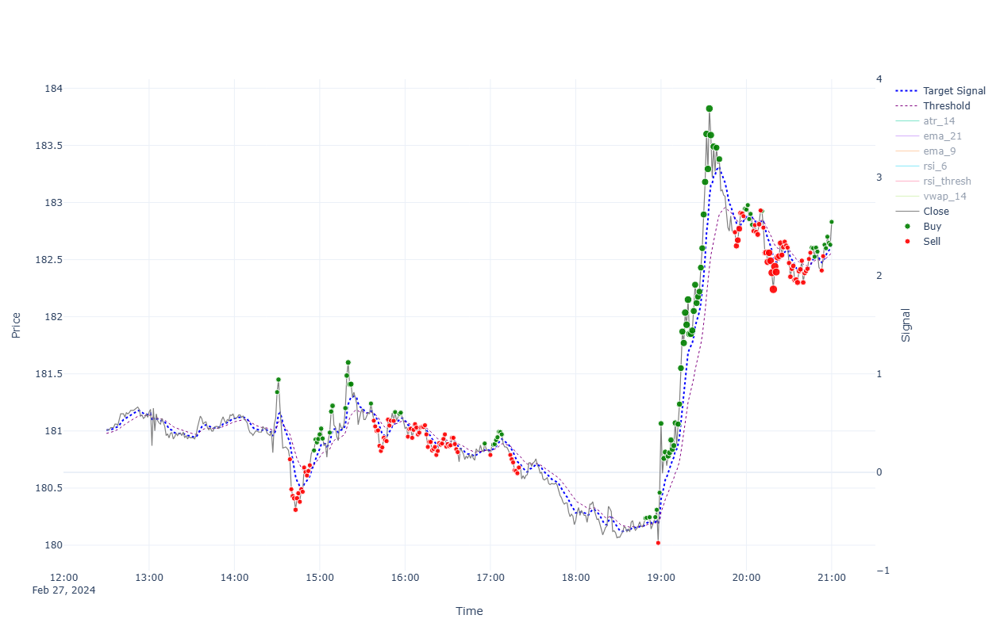


=== Performance for 2024-02-27 00:00:00 ===

INTRADAY:
  shares(626); [buy@181.376, fee_buy=0.004, pos_amnt_buy 113544.048]; [sell@182.793, fee_sell=0.018, pos_amnt_sell 114417.3]; PNL=873.252
TRADES:
  Tr[1]: Time(14:30)Ask(181.376)Bid(181.304)Act(Buy)Shrs(1)Pos(28); CashTr(-181.38)=Cost(-181.376)-Fee(-0.004); P&L(114423.449)=CashTot(109346.945)+PosAmt(5076.504)
  Tr[2]: Time(14:31)Ask(181.486)Bid(181.414)Act(Buy)Shrs(2)Pos(30); CashTr(-362.981)=Cost(-362.973)-Fee(-0.008); P&L(114426.376)=CashTot(108983.964)+PosAmt(5442.411)
  Tr[3]: Time(14:39)Ask(180.788)Bid(180.716)Act(Sell)Shrs(1)Pos(29); CashTr(180.698)=Cost(180.716)-Fee(-0.018); P&L(114405.422)=CashTot(109164.662)+PosAmt(5240.76)
  Tr[4]: Time(14:40)Ask(180.526)Bid(180.454)Act(Sell)Shrs(1)Pos(28); CashTr(180.436)=Cost(180.454)-Fee(-0.018); P&L(114397.807)=CashTot(109345.098)+PosAmt(5052.709)
  Tr[5]: Time(14:41)Ask(180.466)Bid(180.394)Act(Sell)Shrs(2)Pos(26); CashTr(360.751)=Cost(360.788)-Fee(-0.036); P&L(114396.088)=CashTot(10

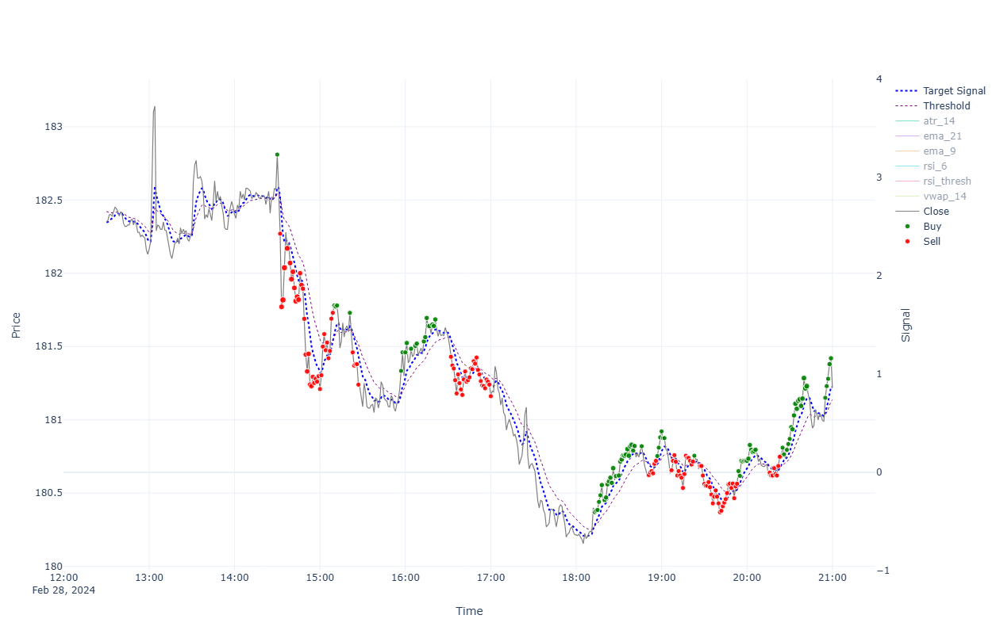


=== Performance for 2024-02-28 00:00:00 ===

INTRADAY:
  shares(625); [buy@182.847, fee_buy=0.004, pos_amnt_buy 114281.601]; [sell@181.184, fee_sell=0.018, pos_amnt_sell 113228.499]; PNL=-1053.103
TRADES:
  Tr[1]: Time(14:30)Ask(182.847)Bid(182.773)Act(Buy)Shrs(1)Pos(96); CashTr(-182.851)=Cost(-182.847)-Fee(-0.004); P&L(114471.055)=CashTot(96924.804)+PosAmt(17546.25)
  Tr[2]: Time(14:32)Ask(182.306)Bid(182.234)Act(Sell)Shrs(1)Pos(95); CashTr(182.215)=Cost(182.234)-Fee(-0.018); P&L(114419.207)=CashTot(97107.02)+PosAmt(17312.187)
  Tr[3]: Time(14:33)Ask(181.807)Bid(181.734)Act(Sell)Shrs(4)Pos(91); CashTr(726.865)=Cost(726.937)-Fee(-0.073); P&L(114371.71)=CashTot(97833.885)+PosAmt(16537.825)
  Tr[4]: Time(14:34)Ask(181.855)Bid(181.782)Act(Sell)Shrs(6)Pos(85); CashTr(1090.582)=Cost(1090.691)-Fee(-0.109); P&L(114375.923)=CashTot(98924.467)+PosAmt(15451.456)
  Tr[5]: Time(14:35)Ask(182.074)Bid(182.001)Act(Sell)Shrs(6)Pos(79); CashTr(1091.9)=Cost(1092.009)-Fee(-0.109); P&L(114394.484)=CashTo

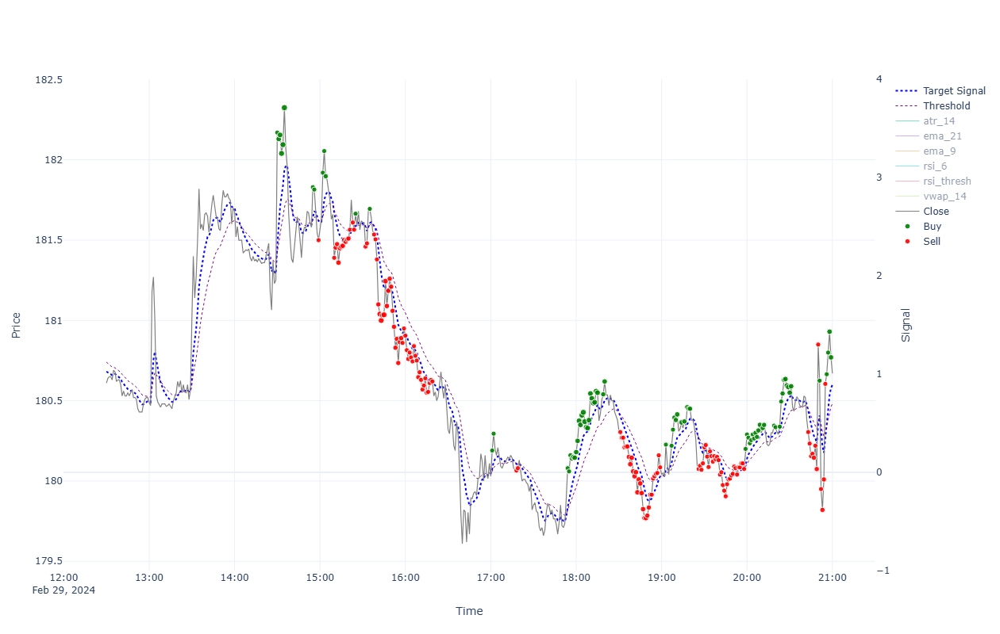


=== Performance for 2024-02-29 00:00:00 ===

INTRADAY:
  shares(621); [buy@182.206, fee_buy=0.004, pos_amnt_buy 113152.68]; [sell@180.634, fee_sell=0.018, pos_amnt_sell 112162.362]; PNL=-990.317
TRADES:
  Tr[1]: Time(14:30)Ask(182.206)Bid(182.134)Act(Buy)Shrs(1)Pos(75); CashTr(-182.21)=Cost(-182.206)-Fee(-0.004); P&L(114423.88)=CashTot(100763.863)+PosAmt(13660.017)
  Tr[2]: Time(14:31)Ask(182.166)Bid(182.094)Act(Buy)Shrs(3)Pos(78); CashTr(-546.511)=Cost(-546.499)-Fee(-0.012); P&L(114420.65)=CashTot(100217.352)+PosAmt(14203.299)
  Tr[3]: Time(14:32)Ask(182.191)Bid(182.119)Act(Buy)Shrs(4)Pos(82); CashTr(-728.782)=Cost(-728.766)-Fee(-0.016); P&L(114422.292)=CashTot(99488.57)+PosAmt(14933.723)
  Tr[4]: Time(14:33)Ask(182.076)Bid(182.004)Act(Buy)Shrs(5)Pos(87); CashTr(-910.402)=Cost(-910.382)-Fee(-0.02); P&L(114412.48)=CashTot(98578.168)+PosAmt(15834.313)
  Tr[5]: Time(14:34)Ask(182.131)Bid(182.058)Act(Buy)Shrs(5)Pos(92); CashTr(-910.676)=Cost(-910.656)-Fee(-0.02); P&L(114416.854)=CashTot(

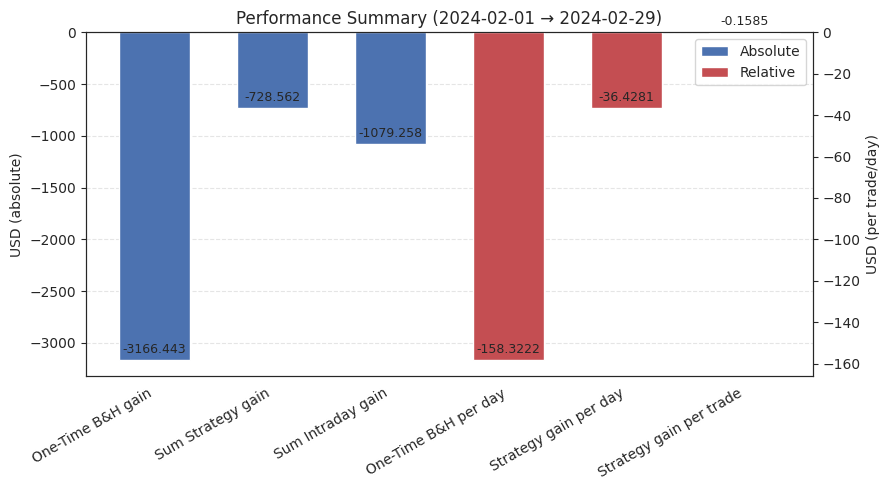


Overall Summary (2024-02-01 = 185.727 → 2024-02-29 = 180.634)
Num. trading days: 20
Trades Count: 4596
Initial capital: 115000.000

One-Time B&H gain: -3166.443 | final: 111833.557 | PnL%: -2.75%
Sum Strategy gain: -728.562 | final: 114271.438 | PnL%: -0.63%
Sum Intraday gain: -1079.258 | final: 113920.742 | PnL%: -0.94%

One-Time B&H gain per day: -158.3222
Strategy gain per day: -36.4281
Strategy gain per trade: -0.1585


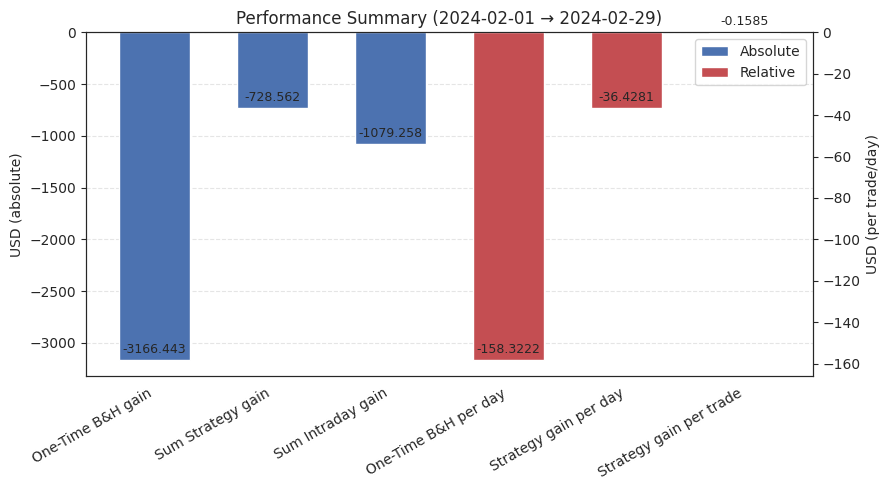

In [9]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = "ema_9",
            sign_thresh        = "ema_21", 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            # extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14'], 
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(days_in_month)], shares = n_shares, df= df_month)
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(sim_results)], shares = n_shares, df = df_inds_test)
